# ROI Iterative MF with fixed whole-image slopes and statistic sweep

??Notebook??`all_roi_spectra200x200.csv` ???? Iterative MF ?????????????????? `a` ????? `y = a*x + b` ????????????????

????????????????????alpha????????????????????????

1. **Broad cleanup**: `line_bin_width = 18 px`?????????????????????? `median`, `mean`, `trimmed_mean`, `sigma_clipped_mean`, `mode` ???????
2. **Thin cleanup**: `line_bin_width = 2 px`??alpha???????????????????????alpha????????`mean`, `median`, `trimmed_mean`, `sigma_clipped_mean`, `mode`, `quantile_75`, `quantile_90`, `upper_mean_75` ???????

???????????????

- `0.9775`: ???????????? y=x ?????
- `1.2520`: ???????????? angle125 ?????
- `1.2664`: angle125 focus ? selected slope
- `2.5575`: angle2475 focus ? selected slope

???? `D:/research/code/outputs_roi_fixed_full_image_slopes_stats_sweep` ??????????? `*_overview.png` ?????????????


In [1]:
from __future__ import annotations

import importlib.util
import sys
from pathlib import Path
from types import ModuleType

import matplotlib

matplotlib.use("Agg")

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


# ============================================================
# 0. User settings
# ============================================================

_THIS_FILE = globals().get("__file__")
THIS_DIR = Path(_THIS_FILE).resolve().parent if _THIS_FILE else Path.cwd()
if not (THIS_DIR / "paper_sensor_geometry_iterative_mf_destriping_full.py").exists():
    fallback_dir = Path(
        r"C:/Users/yudon/Documents/Codex/2026-06-05/files-mentioned-by-the-user-improved/outputs"
    )
    if (fallback_dir / "paper_sensor_geometry_iterative_mf_destriping_full.py").exists():
        THIS_DIR = fallback_dir
MF_CODE = THIS_DIR / "paper_sensor_geometry_iterative_mf_destriping_full.py"

ROI_CSV = Path(r"D:/research/code/all_roi_spectra200x200.csv")
MODTRAN_CSV = Path(r"E:/refit/CH4c.csv")
OUTPUT_DIR = Path(r"D:/research/code/outputs_roi_fixed_full_image_slopes_stats_sweep")

# Slopes transferred from the previous whole-image analyses.
# Direction is y = a*x + b, implemented as constant bands of row - a*col.
FULL_IMAGE_SLOPES = [
    {
        "label": "slope_09775_remaining_thin_lines",
        "slope": 0.9775,
        "source": "remaining-line detection near y=x",
    },
    {
        "label": "slope_12520_prior_angle125",
        "slope": 1.2520,
        "source": "prior angle125 full-image result / visual neighborhood",
    },
    {
        "label": "slope_12664_angle125_selected",
        "slope": 1.2664,
        "source": "angle125 selected slope CSV",
    },
    {
        "label": "slope_25575_angle2475_selected",
        "slope": 2.5575,
        "source": "angle2475 selected slope CSV",
    },
]

# Final-only means:
#   Iterative MF is run first with no stripe removal.
#   Then the fixed full-image slopes are subtracted from the final alpha map.
# This matches a clean MF -> stripe-removal test on the 200x200 ROI.
NSIGMA = 3.0
# Broad cleanup removes several-pixel to several-ten-pixel bands.
BROAD_LINE_BIN_WIDTH = 18.0
BROAD_MIN_PIXELS_PER_LINE = 80
BROAD_EXCLUDE_MODE = "robust_high"

# Thin cleanup removes the remaining line-like artifacts around 1-3 pixels wide.
# It is run after the broad cleanup, using the same full-image slopes.
RUN_THIN_STRIPE_CLEANUP = True
THIN_LINE_BIN_WIDTH = 2.0
THIN_MIN_PIXELS_PER_LINE = 15
THIN_EXCLUDE_MODE = "none"

ANGLE_SWEEP_SAMPLE_STEP = 2
ANGLE_SWEEP_METRIC = "correction_gain"
RUN_INDIVIDUAL_SLOPES = False
RUN_COMBINED_SLOPES = True
RUN_BROAD_ONLY_REFERENCE_CASES = True

# Statistics to compare. The first group changes the broad-band statistic while
# keeping the thin high-alpha-line statistic as mean. The second group keeps the
# broad correction robust with median and changes the thin-line statistic.
BROAD_STAT_METHODS = ["median", "mean", "trimmed_mean", "sigma_clipped_mean", "mode"]
THIN_STAT_METHODS = [
    "mean",
    "median",
    "trimmed_mean",
    "sigma_clipped_mean",
    "mode",
    "quantile_75",
    "quantile_90",
    "upper_mean_75",
]


# ============================================================
# 1. Helpers
# ============================================================

def load_python_file(path: Path, module_name: str) -> ModuleType:
    if not path.exists():
        raise FileNotFoundError(f"Required code file was not found: {path}")
    spec = importlib.util.spec_from_file_location(module_name, path)
    if spec is None or spec.loader is None:
        raise ImportError(f"Could not import {path}")
    module = importlib.util.module_from_spec(spec)
    sys.modules[module_name] = module
    spec.loader.exec_module(module)
    return module


def robust_limits(values, mask=None, q_low=2.0, q_high=98.0) -> tuple[float, float]:
    arrays = values if isinstance(values, (list, tuple)) else [values]
    stacked = []
    for arr in arrays:
        a = np.asarray(arr, dtype=float)
        if mask is not None and a.shape == np.asarray(mask).shape:
            a = a[np.asarray(mask, dtype=bool)]
        else:
            a = a.ravel()
        a = a[np.isfinite(a)]
        if a.size:
            stacked.append(a)
    if not stacked:
        return -1.0, 1.0
    data = np.concatenate(stacked)
    lo, hi = np.nanpercentile(data, [q_low, q_high])
    if not np.isfinite(lo) or not np.isfinite(hi) or lo == hi:
        med = float(np.nanmedian(data))
        spread = float(np.nanstd(data)) or 1.0
        lo, hi = med - spread, med + spread
    return float(lo), float(hi)


def enhanced_statistic_1d(
    values: np.ndarray,
    method: str = "median",
    trim_fraction: float = 0.1,
    mode_bins: int = 64,
    sigma_clip_nsigma: float = 3.0,
    sigma_clip_max_iter: int = 3,
) -> float:
    values = np.asarray(values, dtype=float)
    values = values[np.isfinite(values)]
    if values.size == 0:
        return np.nan

    if method == "median":
        return float(np.nanmedian(values))
    if method == "mean":
        return float(np.nanmean(values))
    if method == "trimmed_mean":
        v = np.sort(values)
        k = int(np.floor(trim_fraction * v.size))
        if 2 * k >= v.size:
            return float(np.nanmean(v))
        return float(np.nanmean(v[k:v.size - k]))
    if method == "mode":
        if values.size == 1 or np.allclose(values, values[0]):
            return float(values[0])
        counts, edges = np.histogram(values, bins=mode_bins)
        idx = int(np.argmax(counts))
        return float(0.5 * (edges[idx] + edges[idx + 1]))
    if method == "sigma_clipped_mean":
        clipped = values.copy()
        for _ in range(int(sigma_clip_max_iter)):
            if clipped.size < 3:
                break
            med = float(np.nanmedian(clipped))
            mad = float(np.nanmedian(np.abs(clipped - med)))
            robust_std = 1.4826 * mad
            if not np.isfinite(robust_std) or robust_std <= 0:
                break
            keep = np.abs(clipped - med) <= sigma_clip_nsigma * robust_std
            if np.all(keep) or not np.any(keep):
                break
            clipped = clipped[keep]
        return float(np.nanmean(clipped))
    if method.startswith("quantile_"):
        q = float(method.split("_", 1)[1])
        return float(np.nanpercentile(values, q))
    if method.startswith("upper_mean_"):
        q = float(method.split("_", 2)[2])
        cutoff = float(np.nanpercentile(values, q))
        upper = values[values >= cutoff]
        if upper.size == 0:
            return float(np.nanmean(values))
        return float(np.nanmean(upper))
    raise ValueError(f"Unknown statistic method: {method}")


def patch_mf_statistics(mf: ModuleType) -> None:
    # Functions inside the imported MF module resolve statistic_1d from the
    # module globals at call time, so replacing it here updates all cleanup
    # stages without editing the shared MF source file.
    mf.statistic_1d = enhanced_statistic_1d


def safe_name(text: str) -> str:
    return (
        str(text)
        .replace(" ", "_")
        .replace(":", "")
        .replace("->", "to")
        .replace("/", "_")
        .replace("\\", "_")
    )


def make_stat_configs() -> tuple[list[dict], list[dict]]:
    broad_only_configs = [
        {
            "label": f"broad_{safe_name(method)}",
            "broad_method": method,
            "thin_method": None,
        }
        for method in BROAD_STAT_METHODS
    ]

    combined_configs: list[dict] = []
    seen = set()
    for broad_method in BROAD_STAT_METHODS:
        cfg = {
            "label": f"broad_{safe_name(broad_method)}_thin_mean",
            "broad_method": broad_method,
            "thin_method": "mean",
        }
        combined_configs.append(cfg)
        seen.add((cfg["broad_method"], cfg["thin_method"]))

    for thin_method in THIN_STAT_METHODS:
        cfg = {
            "label": f"broad_median_thin_{safe_name(thin_method)}",
            "broad_method": "median",
            "thin_method": thin_method,
        }
        key = (cfg["broad_method"], cfg["thin_method"])
        if key not in seen:
            combined_configs.append(cfg)
            seen.add(key)

    return broad_only_configs, combined_configs


def make_angle_params(
    slopes: list[float],
    line_bin_width: float,
    min_pixels_per_line: int,
    cleanup_stage: str,
    method: str,
    exclude_mode: str,
) -> dict:
    return {
        "directions": ["y_minus_x"],
        "method": method,
        "broad_band_method": method,
        "exclude_mode": exclude_mode,
        "exclude_nsigma": NSIGMA,
        "preserve_global_stat": True,
        "trim_fraction": 0.1,
        "mode_bins": 64,
        "sigma_clip_nsigma": 3.0,
        "sigma_clip_max_iter": 3,
        "fallback_to_valid": True,
        "angle_sweep_direction": "y_minus_x",
        "angle_sweep_slope_candidates": [float(s) for s in slopes],
        "angle_sweep_top_k": len(slopes),
        "angle_sweep_min_slope_separation": 0.0,
        "angle_sweep_line_bin_width": float(line_bin_width),
        "angle_sweep_min_pixels_per_line": int(min_pixels_per_line),
        "angle_sweep_sample_step": ANGLE_SWEEP_SAMPLE_STEP,
        "angle_sweep_metric": ANGLE_SWEEP_METRIC,
        "angle_sweep_smooth_half_window": 0,
        "angle_sweep_score_z_min": None,
        "threshold_source": "corrected",
        "fixed_full_image_slopes": [float(s) for s in slopes],
        "cleanup_stage": cleanup_stage,
        "stage_method": method,
        "stage_exclude_mode": exclude_mode,
    }


def run_fixed_slope_cleanup_stage(
    mf: ModuleType,
    alpha_map: np.ndarray,
    valid_mask: np.ndarray,
    plume_for_exclusion: np.ndarray,
    slopes: list[float],
    cleanup_stage: str,
    line_bin_width: float,
    min_pixels_per_line: int,
    method: str,
    exclude_mode: str,
) -> dict:
    params = make_angle_params(
        slopes=slopes,
        line_bin_width=line_bin_width,
        min_pixels_per_line=min_pixels_per_line,
        cleanup_stage=cleanup_stage,
        method=method,
        exclude_mode=exclude_mode,
    )
    out = mf.angle_sweep_directional_cleanup(
        alpha_map=alpha_map,
        valid_mask=valid_mask,
        plume_mask=plume_for_exclusion,
        destripe_params=params,
        nsigma=NSIGMA,
    )

    if out["line_table"] is not None and len(out["line_table"]) > 0:
        out["line_table"] = out["line_table"].copy()
        out["line_table"]["cleanup_stage"] = cleanup_stage
        out["line_table"]["cleanup_line_bin_width"] = float(line_bin_width)

    for table_key in ["search_table", "selected_slopes"]:
        table = out.get(table_key)
        if table is not None and len(table) > 0:
            table = table.copy()
            table["cleanup_stage"] = cleanup_stage
            table["cleanup_line_bin_width"] = float(line_bin_width)
            out[table_key] = table

    out["directional_stripe_maps"] = {
        f"{cleanup_stage}_{key}": value
        for key, value in out["directional_stripe_maps"].items()
    }
    out["params"] = params
    return out


def build_corrected_result(
    mf: ModuleType,
    baseline: dict,
    case_name: str,
    slopes: list[float],
    stat_config: dict,
    use_thin_cleanup: bool,
) -> dict:
    valid = baseline["valid_mask"]
    raw = baseline["alpha_final_raw"]
    plume_for_exclusion = baseline["plume_mask_final"]

    stages = [
        (
            "broad",
            BROAD_LINE_BIN_WIDTH,
            BROAD_MIN_PIXELS_PER_LINE,
            stat_config["broad_method"],
            BROAD_EXCLUDE_MODE,
        )
    ]
    if use_thin_cleanup and RUN_THIN_STRIPE_CLEANUP:
        stages.append(
            (
                "thin",
                THIN_LINE_BIN_WIDTH,
                THIN_MIN_PIXELS_PER_LINE,
                stat_config["thin_method"],
                THIN_EXCLUDE_MODE,
            )
        )

    current = raw.copy()
    total_stripe = np.zeros_like(raw, dtype=float)
    directional_maps: dict[str, np.ndarray] = {}
    line_tables = []
    slope_search_tables: dict[str, pd.DataFrame] = {}
    stage_params = []

    for cleanup_stage, line_bin_width, min_pixels_per_line, method, exclude_mode in stages:
        out = run_fixed_slope_cleanup_stage(
            mf=mf,
            alpha_map=current,
            valid_mask=valid,
            plume_for_exclusion=plume_for_exclusion,
            slopes=slopes,
            cleanup_stage=cleanup_stage,
            line_bin_width=line_bin_width,
            min_pixels_per_line=min_pixels_per_line,
            method=method,
            exclude_mode=exclude_mode,
        )
        current = out["corrected"]
        total_stripe += out["stripe_map"]
        directional_maps.update(out["directional_stripe_maps"])
        if out["line_table"] is not None and len(out["line_table"]) > 0:
            line_tables.append(out["line_table"])
        slope_search_tables[f"{cleanup_stage}_all_candidates"] = out["search_table"]
        slope_search_tables[f"{cleanup_stage}_selected_slopes"] = out["selected_slopes"]
        stage_params.append(out["params"])

    corrected = current
    line_table = pd.concat(line_tables, ignore_index=True) if line_tables else pd.DataFrame()
    params = {
        "directions": ["y_minus_x"],
        "method": (
            f"broad:{stat_config['broad_method']} -> thin:{stat_config['thin_method']}"
            if use_thin_cleanup and RUN_THIN_STRIPE_CLEANUP
            else f"broad:{stat_config['broad_method']}"
        ),
        "fixed_full_image_slopes": [float(s) for s in slopes],
        "cleanup_stages": " -> ".join(stage for stage, _, _, _, _ in stages),
        "stage_params": stage_params,
        "threshold_source": "corrected",
        "auto_slope": False,
        "broad_line_bin_width": BROAD_LINE_BIN_WIDTH,
        "thin_line_bin_width": THIN_LINE_BIN_WIDTH if use_thin_cleanup else None,
        "broad_method": stat_config["broad_method"],
        "broad_exclude_mode": BROAD_EXCLUDE_MODE,
        "thin_method": stat_config["thin_method"] if use_thin_cleanup else None,
        "thin_exclude_mode": THIN_EXCLUDE_MODE if use_thin_cleanup else None,
        "stat_config_label": stat_config["label"],
    }

    plume, threshold_meta = mf.plume_mask_from_alpha(corrected, valid, nsigma=NSIGMA)

    result = dict(baseline)
    result["destripe_when"] = "final_only_fixed_full_image_slopes"
    result["destripe_params"] = params
    result["alpha_final_corrected"] = corrected
    result["alpha_final_used"] = corrected
    result["stripe_map_final"] = total_stripe
    result["directional_stripe_maps_final"] = directional_maps
    result["plume_mask_final"] = plume
    result["threshold_meta_final"] = threshold_meta
    result["line_table_final"] = line_table
    result["slope_search_tables_final"] = slope_search_tables
    result["case_name"] = case_name
    return result


def plot_case(case_name: str, result: dict, output_dir: Path, common_limits: tuple[float, float]) -> None:
    output_dir.mkdir(parents=True, exist_ok=True)
    valid = result["valid_mask"]
    raw = result["alpha_final_raw"]
    corr = result["alpha_final_corrected"]
    stripe = result["stripe_map_final"]
    plume = result["plume_mask_final"]

    vmin, vmax = common_limits
    svmin, svmax = robust_limits(stripe, mask=valid)

    fig, axes = plt.subplots(1, 4, figsize=(16, 4.2), constrained_layout=True)
    im0 = axes[0].imshow(raw, origin="upper", vmin=vmin, vmax=vmax)
    axes[0].set_title("raw alpha")
    plt.colorbar(im0, ax=axes[0], fraction=0.046)

    im1 = axes[1].imshow(stripe, origin="upper", vmin=svmin, vmax=svmax)
    axes[1].set_title("estimated stripe")
    plt.colorbar(im1, ax=axes[1], fraction=0.046)

    im2 = axes[2].imshow(corr, origin="upper", vmin=vmin, vmax=vmax)
    axes[2].set_title("corrected alpha")
    plt.colorbar(im2, ax=axes[2], fraction=0.046)

    im3 = axes[3].imshow(plume, origin="upper")
    axes[3].set_title("plume mask")
    plt.colorbar(im3, ax=axes[3], fraction=0.046)

    fig.suptitle(case_name)
    fig.savefig(output_dir / f"{case_name}_overview.png", dpi=180)
    plt.close(fig)


def plot_summary(summary: pd.DataFrame, output_dir: Path) -> None:
    height = max(5.0, 0.34 * len(summary))
    fig, axes = plt.subplots(1, 2, figsize=(14, height), constrained_layout=True)
    axes[0].barh(summary["name"], summary["plume_pixels"])
    axes[0].invert_yaxis()
    axes[0].set_xlabel("plume pixels")
    axes[0].set_title("Plume-mask size")

    axes[1].barh(summary["name"], summary["robust_std"])
    axes[1].invert_yaxis()
    axes[1].set_xlabel("robust std")
    axes[1].set_title("Alpha dispersion")

    fig.savefig(output_dir / "summary_plume_pixels_and_robust_std.png", dpi=180)
    plt.close(fig)


# ============================================================
# 2. Main workflow
# ============================================================

def main() -> dict[str, dict]:
    OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
    mf = load_python_file(MF_CODE, "paper_sensor_geometry_iterative_mf_destriping_full")
    patch_mf_statistics(mf)

    slope_df = pd.DataFrame(FULL_IMAGE_SLOPES)
    slope_df["angle_deg_from_x_axis"] = np.degrees(np.arctan(slope_df["slope"].astype(float)))
    slope_df["angle_deg_from_y_eq_x"] = slope_df["angle_deg_from_x_axis"] - 45.0
    slope_df.to_csv(OUTPUT_DIR / "fixed_full_image_slopes_used.csv", index=False)

    roi_df, wavelengths, spectra = mf.load_roi_spectra_csv(ROI_CSV)
    cube, ys, xs = mf.spectra_to_cube(roi_df, spectra)
    valid_mask = mf.make_valid_pixel_mask(
        cube,
        nodata_values=mf.NODATA_VALUES,
        require_positive=mf.REQUIRE_POSITIVE,
        min_valid_fraction=mf.MIN_VALID_FRACTION,
    )
    cube_sel, wavelengths_sel, _ = mf.select_bands(cube, wavelengths, mf.WL_MIN, mf.WL_MAX)
    mod_wave, alpha_grid, mod_spectra = mf.load_ch4_modtran_csv(MODTRAN_CSV)
    mod_resampled = mf.gaussian_srf_resample(
        mod_wave=mod_wave,
        mod_spectra=mod_spectra,
        sensor_wave=wavelengths_sel,
        fwhm_nm=mf.FWHM_NM,
    )
    uas, _ = mf.compute_uas_log_slope(
        alpha_grid=alpha_grid,
        spectra_grid=mod_resampled,
        alpha_min=mf.UAS_ALPHA_MIN,
        alpha_max=mf.UAS_ALPHA_MAX,
    )

    print(f"ROI table: {roi_df.shape}")
    print(f"Cube: {cube.shape}, selected bands: {cube_sel.shape}")
    print(f"Valid pixels: {int(np.sum(valid_mask))} / {valid_mask.size}")
    print("Fixed full-image slopes:")
    print(slope_df.to_string(index=False))

    print("\nRunning baseline Iterative MF...")
    baseline = mf.run_iterative_mf_with_optional_destriping(
        cube=cube_sel,
        uas=uas,
        valid_mask=valid_mask,
        n_iter=mf.N_ITER,
        nsigma=NSIGMA,
        reg=mf.REG,
        rcond=mf.RCOND,
        destripe_when="none",
        destripe_params=None,
        verbose=True,
    )
    results = {"baseline_no_destripe": baseline}

    experiments: list[tuple[str, list[float]]] = []
    if RUN_INDIVIDUAL_SLOPES:
        experiments.extend((item["label"], [float(item["slope"])]) for item in FULL_IMAGE_SLOPES)
    if RUN_COMBINED_SLOPES:
        experiments.append((
            "slopes_09775_12664_25575_combined",
            [0.9775, 1.2664, 2.5575],
        ))
        experiments.append((
            "slopes_09775_12520_12664_25575_combined",
            [float(item["slope"]) for item in FULL_IMAGE_SLOPES],
        ))

    broad_only_configs, combined_stat_configs = make_stat_configs()

    stat_config_rows = []
    for cfg in broad_only_configs:
        stat_config_rows.append({**cfg, "cleanup": "broad_only"})
    for cfg in combined_stat_configs:
        stat_config_rows.append({**cfg, "cleanup": "broad_then_thin"})
    pd.DataFrame(stat_config_rows).to_csv(OUTPUT_DIR / "stat_configs_used.csv", index=False)

    for case_name, slopes in experiments:
        if RUN_BROAD_ONLY_REFERENCE_CASES:
            for stat_config in broad_only_configs:
                broad_case_name = f"{case_name}_{stat_config['label']}_only"
                print("\n" + "=" * 80)
                print(f"Applying broad fixed-slope stripe removal: {broad_case_name}")
                print(f"slopes = {slopes}")
                print(f"broad method = {stat_config['broad_method']}")
                print("=" * 80)
                results[broad_case_name] = build_corrected_result(
                    mf,
                    baseline,
                    broad_case_name,
                    slopes,
                    stat_config=stat_config,
                    use_thin_cleanup=False,
                )

        for stat_config in combined_stat_configs:
            thin_case_name = f"{case_name}_{stat_config['label']}"
            print("\n" + "=" * 80)
            print(f"Applying broad + thin fixed-slope stripe removal: {thin_case_name}")
            print(f"slopes = {slopes}")
            print(
                f"broad method = {stat_config['broad_method']}, "
                f"thin method = {stat_config['thin_method']}"
            )
            print("=" * 80)
            results[thin_case_name] = build_corrected_result(
                mf,
                baseline,
                thin_case_name,
                slopes,
                stat_config=stat_config,
                use_thin_cleanup=True,
            )

    summary = mf.summarize_results_table(results)
    summary.to_csv(OUTPUT_DIR / "summary_df.csv", index=False)
    summary.sort_values(["plume_pixels", "robust_std"], ascending=[True, True]).to_csv(
        OUTPUT_DIR / "summary_ranked_by_plume_pixels.csv",
        index=False,
    )
    summary.sort_values(["robust_std", "plume_pixels"], ascending=[True, True]).to_csv(
        OUTPUT_DIR / "summary_ranked_by_robust_std.csv",
        index=False,
    )
    print("\nSummary")
    print(summary.to_string(index=False))
    print(f"Saved: {OUTPUT_DIR / 'summary_df.csv'}")

    common_limits = robust_limits(
        [res["alpha_final_raw"] for res in results.values()] + [res["alpha_final_corrected"] for res in results.values()],
        mask=valid_mask,
    )

    for case_name, result in results.items():
        mf.save_case_outputs(result, case_name, OUTPUT_DIR, ys=ys, xs=xs)
        plot_case(case_name, result, OUTPUT_DIR, common_limits)
        print(f"Saved outputs: {case_name}")

    plot_summary(summary, OUTPUT_DIR)
    print(f"Saved: {OUTPUT_DIR / 'summary_plume_pixels_and_robust_std.png'}")
    print(f"Saved: {OUTPUT_DIR / 'fixed_full_image_slopes_used.csv'}")
    print(f"Saved: {OUTPUT_DIR / 'stat_configs_used.csv'}")

    return results



In [2]:
# ????
# ?????? User settings ????????????????
results = main()


ROI table: (40000, 187)
Cube: (200, 200, 185), selected bands: (200, 200, 29)
Valid pixels: 39997 / 40000
Fixed full-image slopes:
                           label  slope                                                 source  angle_deg_from_x_axis  angle_deg_from_y_eq_x
slope_09775_remaining_thin_lines 0.9775                      remaining-line detection near y=x              44.348117              -0.651883
      slope_12520_prior_angle125 1.2520 prior angle125 full-image result / visual neighborhood              51.384867               6.384867
   slope_12664_angle125_selected 1.2664                            angle125 selected slope CSV              51.703970               6.703970
  slope_25575_angle2475_selected 2.5575                           angle2475 selected slope CSV              68.644162              23.644162

Running baseline Iterative MF...
iter 01 | bg=   39997 | thr=+1.017780e-01 | med=-6.491951e-05 | rstd=3.394762e-02 | plume=     123 | destripe=False | directions=[

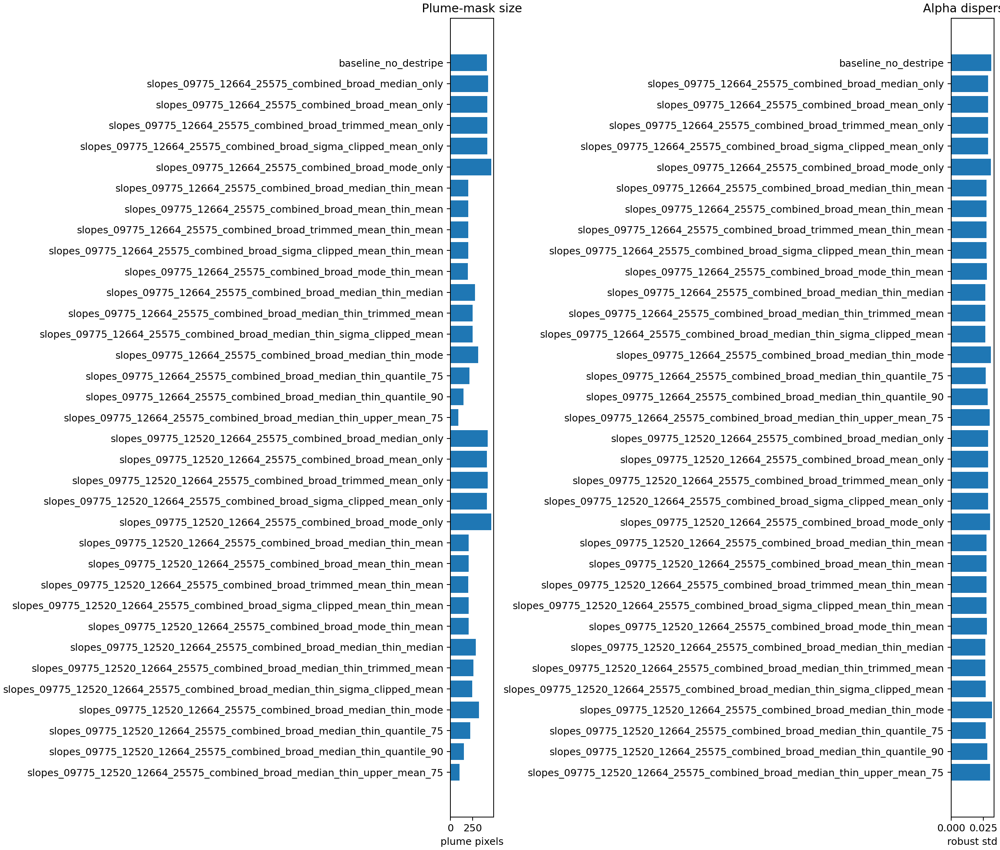

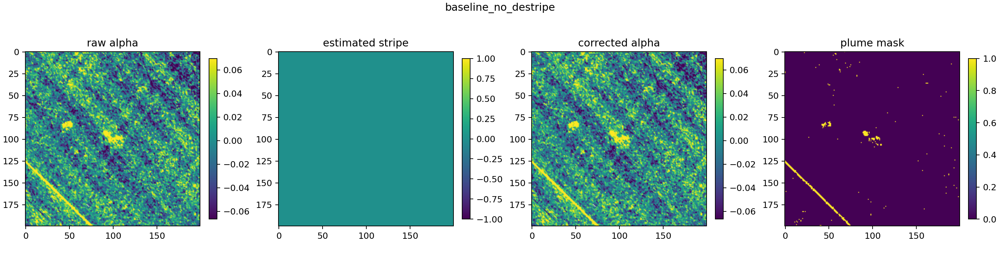

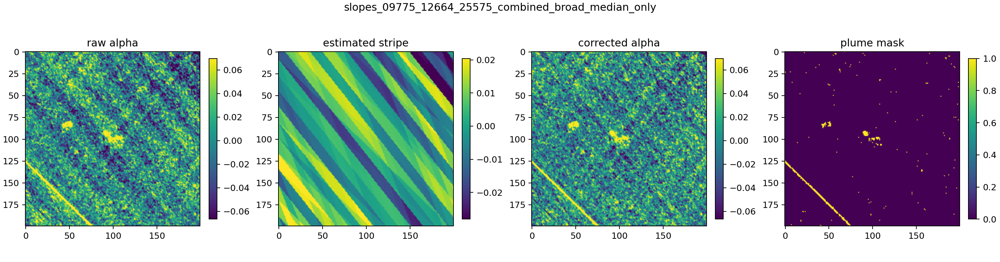

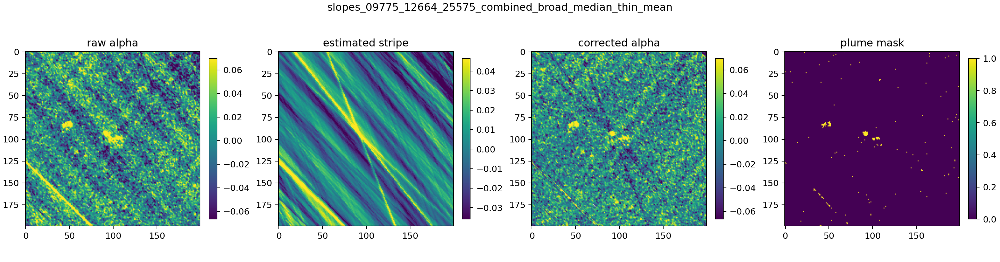

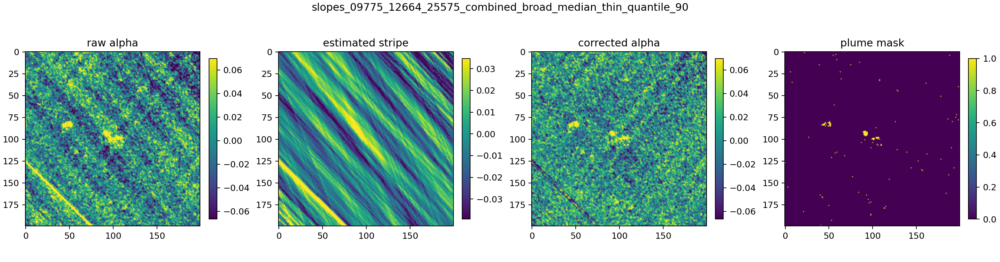

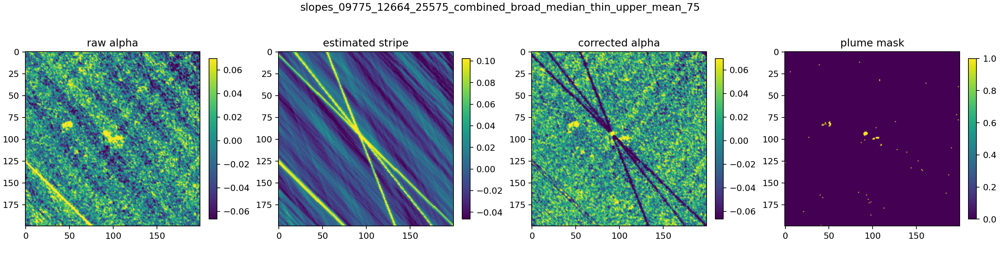

In [3]:
from IPython.display import display, Image
from pathlib import Path

output_dir = Path(r"D:/research/code/outputs_roi_fixed_full_image_slopes_stats_sweep")
summary_png = output_dir / "summary_plume_pixels_and_robust_std.png"
if summary_png.exists():
    display(Image(filename=str(summary_png)))

# ???????????????? output_dir ? *_overview.png ??????????
for name in [
    "baseline_no_destripe_overview.png",
    "slopes_09775_12664_25575_combined_broad_median_only_overview.png",
    "slopes_09775_12664_25575_combined_broad_median_thin_mean_overview.png",
    "slopes_09775_12664_25575_combined_broad_median_thin_quantile_90_overview.png",
    "slopes_09775_12664_25575_combined_broad_median_thin_upper_mean_75_overview.png",
]:
    png = output_dir / name
    if png.exists():
        display(Image(filename=str(png)))
